<a href="https://colab.research.google.com/github/francisco-mgoncalves/STA4032/blob/main/Final_Project_Notebook_Hahn_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt  #Imports "matplotlib.pyplot" to create visualizations, commonly used for plotting. Defines it as plt
import imageio  #Imports imageio for reading and writing a wide range of image data, including animated images, video, and volumetric data.
import torch  # Imports "PyTorch" or "torch", a library for tensor computations (similar to NumPy arrays) with strong support for GPU acceleration and deep learning.
import torchvision  #Imports torchvision, a package of the PyTorch project that provides access to popular datasets, model architectures, and common image transformations for computer vision.
from torchvision import models, transforms  #Imports models and transforms from torchvision: (models: Provides pre-trained models that can be used for inference)(transforms: Offers common image transformations for preprocessing).
import numpy as np  #Imports NumPy for numerical operations on large, multi-dimensional arrays and matrices.
from torchvision.models import *  #Imports all submodules from torchvision.models, providing access to various pre-trained models.
from PIL import Image  #Imports Image from PIL (Python Imaging Library) to support opening, manipulating, and saving many different image file formats.
import requests  #Imports requests to allow Python to send HTTP requests, which can be used to fetch data over the internet.
from torchvision import models  #This line is redundant as `models` has already been imported from `torchvision` above.
from torchsummary import summary  #Imports summary from torchsummary, a utility that provides a quick overview of the model architecture and parameter count.

The code imports key Python libraries for image processing and deep learning. It includes modules like "matplotlib.pyplot" for visualization, "imageio" for handling image data, and "torch" for tensor computations, particularly suited for deep learning tasks with GPU support. "torchvision" provides access to datasets, pre-trained models, and image transformations. "numpy" is imported for numerical operations, while "requests" allows fetching data over HTTP. Redundant imports for "models" from "torchvision" are present. Finally, "torchsummary"'s "summary" function is imported for quick model architecture overviews.

In [ ]:
def plot(x): #Function to plot an image
    fig, ax = plt.subplots() #Create a plot figure and axes
    im = ax.imshow(x,cmap='gray') #Display image in grayscale
    ax.axis('off') #Hide axis
    fig.set_size_inches(20, 20) #Set figure size
    plt.show() #Display the plot

Defines a function called "plot" that takes a single argument "x", which presumably represents an image. The mathematical concepts involved are as follow:

Plotting: The code uses the Matplotlib library to create a plot. Matplotlib is a popular Python library used for creating static, animated, and interactive visualizations in Python. The "plot" function uses Matplotlib's "subplots()" function to create a plot figure ("fig") and axes ("ax").

Image Display: Inside the function, the image "x" is displayed using "imshow()" function of Matplotlib's "Axes" object ("ax"). The parameter "cmap='gray'" specifies that the image should be displayed in grayscale.

Figure and Axis Configuration: The function configures the plot to hide the axis by calling "ax.axis('off')". It also sets the size of the figure using "fig.set_size_inches(20, 20)".

Plot Display: Finally, the function displays the plot using "plt.show()", where "plt" is a common alias for "matplotlib.pyplot".

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') #This line uses the `imread` function from the `imageio` library to read an image from a URL. The image is loaded into the variable `im`.

<ipython-input-3-af915e8b952e>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') #This line uses the `imread` function from the `imageio` library to read an image from a URL. The image is loaded into the variable `im`.


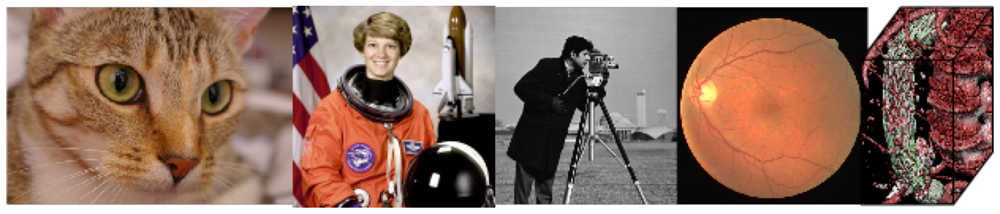

In [ ]:
plot(im) #Plot image

In [ ]:
net = alexnet(pretrained=True).cuda(0) #Initialize and load pretrained AlexNet model and move it to GPU 0

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 129MB/s]


In [ ]:
#Define normalization and preprocessing steps for input images
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],  #Means for the RGB channels; values are typical means used for pre-trained models.
   std=[0.229, 0.224, 0.225]    #Standard deviations for the RGB channels; values are typical stds used for pre-trained models.
)
#Compose several image transformations together into a single transform to be applied on image data.
preprocess = transforms.Compose([
   transforms.Resize(256),       #Resize the input image to 256x256 pixels, a common size for pre-processing.
   transforms.CenterCrop(224),   #Crop the image at the center to 224x224 pixels, the typical input size for many CNN models.
   transforms.ToTensor(),        #Convert the image to a tensor, which is the format required by PyTorch models.
   normalize                     #Apply the normalization defined above to the tensor.
])

This cell applies normalization and preprocessing to input images. The mathematical concepts involved are as follows:

Normalization: Adjusts pixel values to have a mean of 0 and standard deviation of 1 for each channel.

Image Transformations: Resizing, cropping, and converting images to tensors involve geometric and algebraic operations.

Compose Transformation: Combines transformations sequentially, akin to function composition.

PyTorch Tensor Operations: Involves element-wise subtraction and division on tensors for normalization.


In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') #Uses imageio.imread to read and load a golden retriever puppy image from a specified URL into the variable `im`.

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


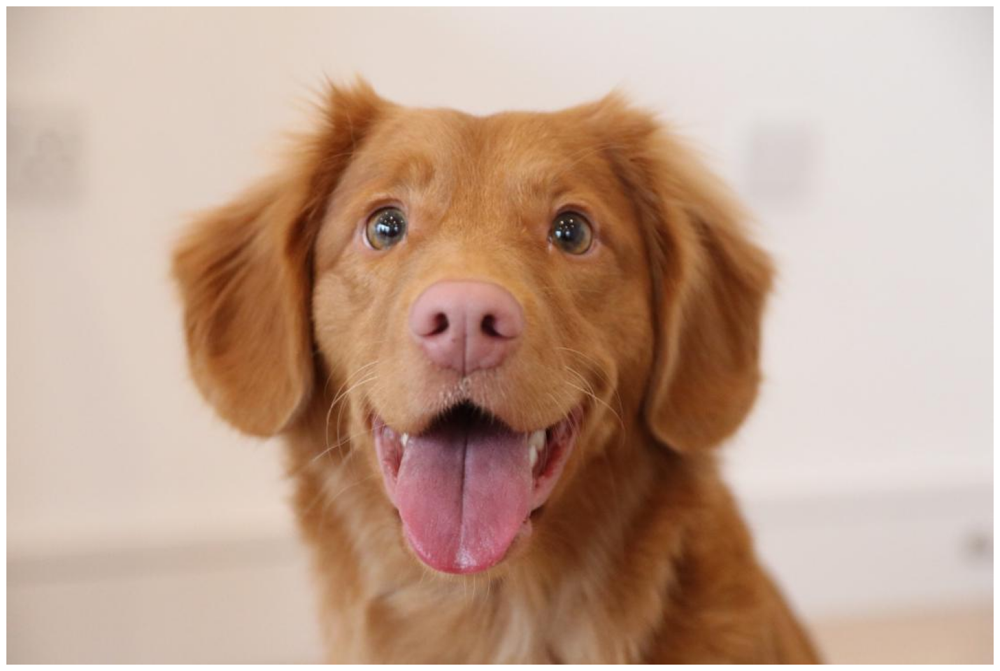

In [ ]:
plot(im) #Displays the image

In [ ]:
image = Image.fromarray(im) #Convert to pil

In [ ]:
img_tensor = preprocess(image)  #Transform and convert the image to a tensor ready for model input.

In [ ]:
img_tensor = img_tensor.unsqueeze_(0)  #Add a batch dimension to the tensor to make it suitable for model input.

In [ ]:
img_tensor.shape  #Retrieve and display the shape of the tensor, which includes the batch size, channels, height, and width.

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0)  #Convert the tensor to a torch variable and move it to GPU device 0 for processing.

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


This cell involves key mathematical concepts:

Image Representation: Images are arrays of pixel values, with the input image ("im") assumed to be a NumPy array.

Conversion to PIL Image: Using "Image.fromarray()", the NumPy array is converted to a PIL image for image manipulation and processing.

Preprocessing: The "preprocess" function likely performs tasks like resizing, normalization, or other transformations to prepare the image for neural network input.

Tensor Representation: Neural networks operate on tensors, so the image is converted into a tensor after preprocessing.

Adding a Batch Dimension: "img_tensor.unsqueeze_(0)" adds a batch dimension, as neural networks often process data in batches for efficiency.

GPU Acceleration: Tensor computation is moved to the GPU using "torch.tensor(img_tensor).cuda(0)", leveraging GPU acceleration for faster processing compared to CPU-based computation. These concepts collectively facilitate efficient image processing and neural network computation, crucial for tasks like computer vision.

In [ ]:
out = net(img_variable)  #Pass the image tensor through the network 'net' to obtain the output predictions.

In [ ]:
label_index = out.cpu().data.numpy().argmax()  #Move the output tensor to CPU, convert it to a NumPy array, and find the index of the maximum value.

In [ ]:
label_index  #Display the index of the class with the highest probability as predicted by the model.

207

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])  #Get the top 10 predictions by sorting the output probabilities and flipping the order.

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'  #Define the URL to fetch the JSON file containing class labels.

In [ ]:
labels = {int(key): value for (key, value) in requests.get(LABELS_URL).json().items()}  #Fetch and parse the JSON from LABELS_URL into a dictionary with integer keys.

In [ ]:
print(labels[label_index])  #Print the class label corresponding to the highest probability index predicted by the model.

golden retriever


In [ ]:
for i in range(10):  #Iterate through the top 10 indices.
    print(labels[top_list[i]])  #Print the label corresponding to each index in the top 10 list.

golden retriever
Brittany spaniel
Sussex spaniel
Irish setter, red setter
tennis ball
Labrador retriever
cocker spaniel, English cocker spaniel, cocker
Chesapeake Bay retriever
Australian terrier
vizsla, Hungarian pointer


In [ ]:
net  #Display the neural network model's structure and current state.

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))  #Display a summary of the model 'net', including layer details for an input size of (3, 224, 224).

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()  #Process the image variable through the first layer of the model, then move output to CPU and convert to a NumPy array.

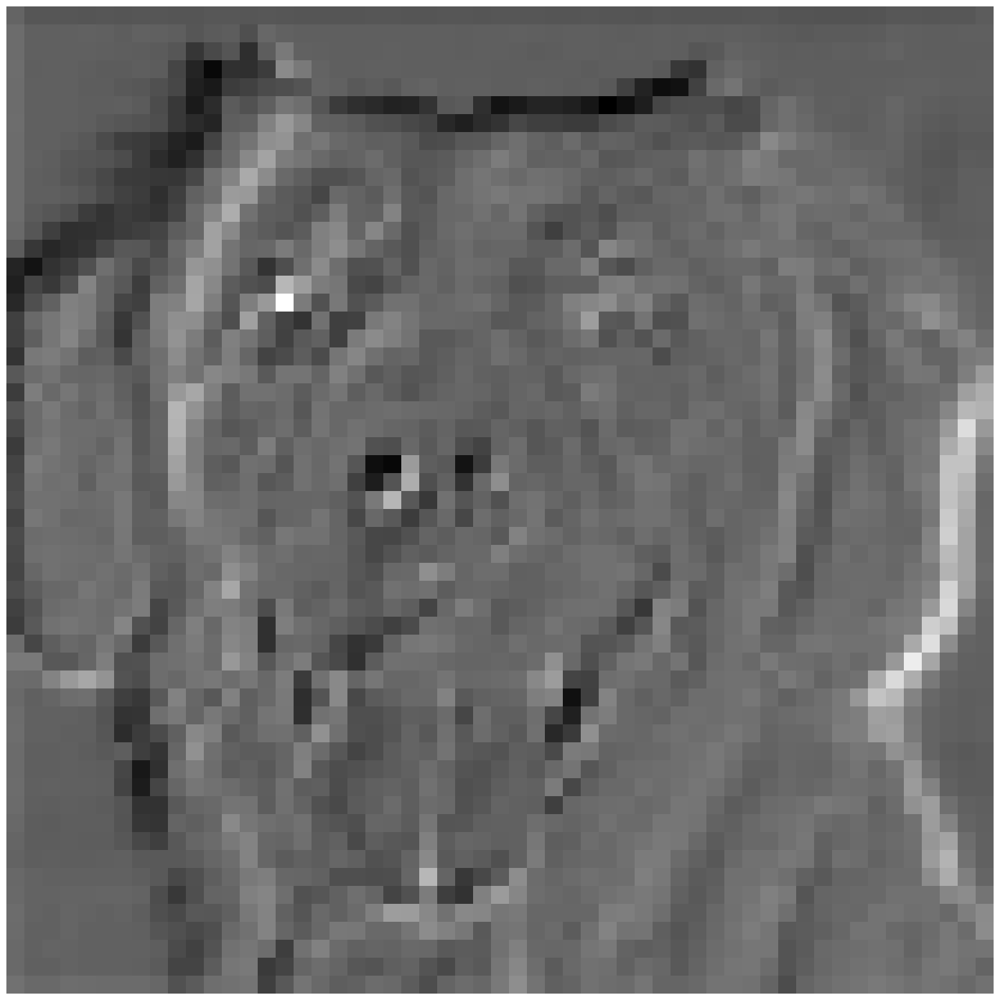

In [ ]:
plot(out[0,0,:,:]) #Render and display the first channel of the first output feature map using matplotlib.

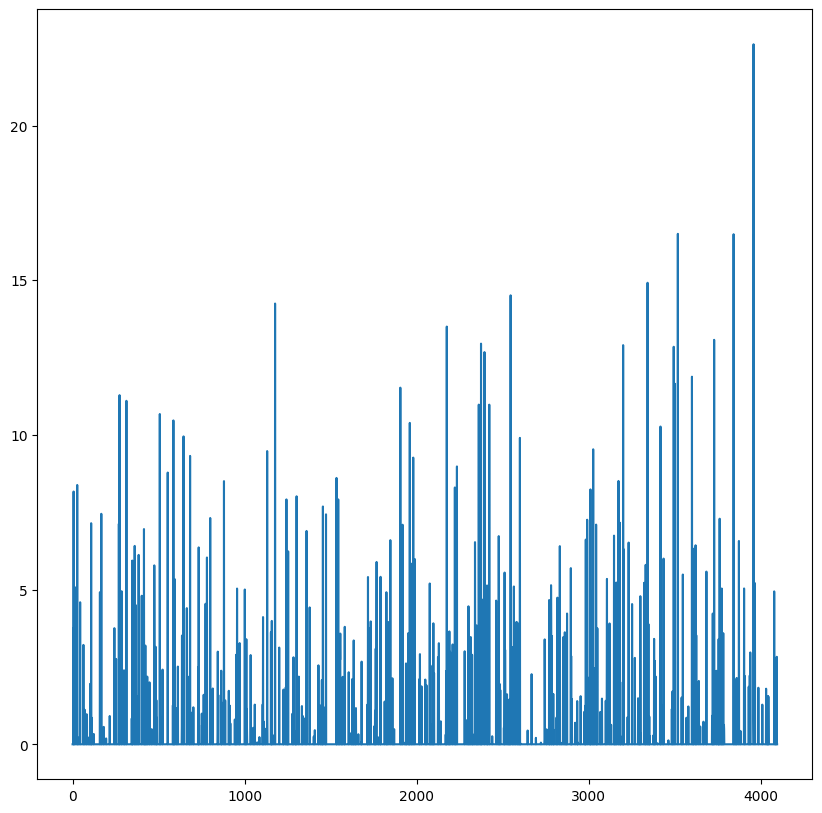

In [ ]:
plt.plot(np.arange(4096), net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())  #Plot the outputs of a partial network processing.
fig = plt.gcf()  #Get the current figure using matplotlib.
fig.set_size_inches(10, 10)  #Set the size of the figure to 10x10 inches.

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')  #Read an image from the specified URL using imageio.

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


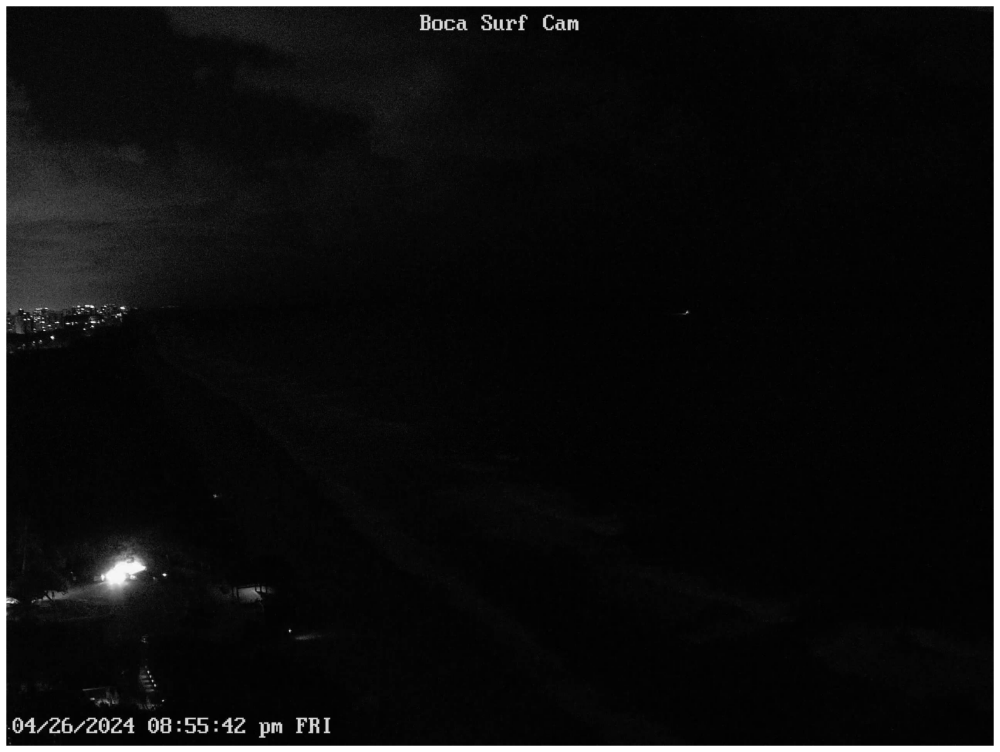

In [ ]:
plot(im)

In [ ]:
def load_im(im):
    image = Image.fromarray(im)  #Convert the numpy array to a PIL image.
    img_tensor = preprocess(image)  #Apply the preprocessing transformations to the image.
    img_tensor = img_tensor.unsqueeze_(0)  #Add a batch dimension to the tensor.
    img_variable = torch.tensor(img_tensor).cuda(0)  #Convert the tensor to a torch tensor and move it to GPU.
    return img_variable  #Return the processed image tensor ready for model input.

This cell involves key mathematical concepts:

1. Image Representation: Images are arrays of pixel values, with the input image ("im") assumed to be a NumPy array.
2. Conversion to PIL Image: Using "Image.fromarray()", the NumPy array is converted to a PIL image for image manipulation and processing.
3. Preprocessing: The "preprocess" function likely performs tasks like resizing, normalization, or other transformations to prepare the image for neural network input.
4. Tensor Representation: Neural networks operate on tensors, so the image is converted into a tensor after preprocessing.
5. Adding a Batch Dimension: "img_tensor.unsqueeze_(0)" adds a batch dimension, as neural networks often process data in batches for efficiency.
6. GPU Acceleration: Tensor computation is moved to the GPU using "torch.tensor(img_tensor).cuda(0)", leveraging GPU acceleration for faster processing compared to CPU-based computation.
These concepts collectively facilitate efficient image processing and neural network computation, crucial for tasks like computer vision.

In [ ]:
out = net(load_im(im))  #Pass the processed image tensor through the network to get the output.

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):
    out = net(load_im(im))  #Obtain the model output for the processed image.
    label_index = out.cpu().data.numpy().argmax()  #Determine the index of the highest probability class.
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])  #Identify the top 10 prediction indices.
    print(labels[label_index])  #Print the label of the highest probability class.
    print('____')  #Print a separator.
    for i in range(10):  #Loop through the top 10 classes.
        print(labels[top_list[i]])  #Print the labels of the top 10 predicted classes.

The "argmax()" function finds the index of the maximum value in the output tensor, which corresponds to the predicted label for the input image.

The "argsort()" function sorts the output tensor along its axis in ascending order and returns the indices that would sort the array.

"np.flip()" reverses the sorted indices to get the highest probabilities first.

The loop prints the top 10 predicted labels along with their probabilities.

In [ ]:
inference(im)  #Run the inference function with the image 'im' to print the predicted label and top 10 predictions.

matchstick
____
matchstick
spotlight, spot
nematode, nematode worm, roundworm
lighter, light, igniter, ignitor
digital clock
stove
analog clock
jellyfish
jack-o'-lantern
lampshade, lamp shade


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
%%capture
#"%%capture" suppress output from the following commands in the Jupyter notebook cell.
!pip install wandb  #Install the wandb library, used for experiment tracking and visualization.
!apt-get install poppler-utils  #Install poppler-utils, a PDF rendering library needed by pdf2image.
!pip install pdf2image  #Install pdf2image to convert PDF files into images.
!pip install flashtorch  #Install flashtorch, a library for visualizing feature maps and gradients in neural networks.
import requests  #Import the requests library for making HTTP requests.
from pdf2image import convert_from_path  #Import function to convert PDF files to images.
import matplotlib.pyplot as plt  #Import matplotlib for creating visualizations.
import numpy as np  #Import NumPy for numerical operations.
import torch  #Import PyTorch, a deep learning framework.
from torchvision import *  #Import everything from torchvision, which includes data utilities and models.
from torchvision.models import *  #Import all models from torchvision for easy access to pretrained models.
from flashtorch.utils import apply_transforms  #Import utility function for applying image transforms.
import wandb as wb  #Import wandb as wb for shorter reference, used for tracking experiments.

This code installs necessary packages like 'wandb', 'poppler-utils', and 'pdf2image'. It also imports required modules for image processing and deep learning tasks. Additionally, it sets up dependencies for visualization and model manipulation. Finally, it initializes the 'wandb' library, possibly for tracking experiments or model training progress.

In [ ]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))  #Convert data to a tensor with gradients, on GPU.

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))  #Convert data to a tensor without gradients, on GPU.


In [ ]:
def plot(x):
    fig, ax = plt.subplots()  #Create a new figure and a set of subplots.
    im = ax.imshow(x, cmap='gray')  #Display the data as an image with a grayscale colormap.
    ax.axis('off')  #Turn off the axis.
    fig.set_size_inches(5, 5)  #Set the figure size to 5x5 inches.
    plt.show()  #Display the figure.

The main mathematical concept here is the visualization of a grayscale image represented by a 2D array x. Each element of the array corresponds to the intensity of a pixel in the image. The imshow function from Matplotlib is used to display this image with a grayscale colormap (gray). The fig.set_size_inches(5, 5) sets the size of the figure to be displayed. The axis('off') function call turns off the axis labels and ticks, providing a clean image visualization without any extra annotations.

In [ ]:
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"  #Base URL for Google Slides.
    url_body = url.split('/')[5]  #Extract the presentation ID from the URL.
    page_id = url.split('.')[-1]  #Extract the page ID from the URL.
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id  #Construct URL to download specific slide as PDF.

def get_slides(url):
    url = get_google_slide(url)  #Generate the correct URL for downloading the slide as a PDF.
    r = requests.get(url, allow_redirects=True)  #Make a request to the URL and allow redirects.
    open('file.pdf', 'wb').write(r.content)  #Save the fetched content as 'file.pdf'.
    images = convert_from_path('file.pdf', 500)  #Convert the PDF file into images with a dpi of 500.
    return images  #Return the list of images converted from the PDF slides.

def load(image):
    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)  #Apply transforms, detach, enable gradients, and move to device.

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")  #Set the device to GPU if available, otherwise use CPU.

TThis cell has various operations:

URL Parsing: Extracting essential details from a URL, relying on string manipulation.

HTTP Request: Fetching a PDF file via an HTTP GET request, primarily involving networking and file handling.

PDF to Images Conversion: Transforming PDF slides into images using an external library, centered on image processing.

Neural Network Operations: Within the load function, applying transformations to images, enabling gradient computation for training, and managing tensors, grounded in neural network principles.

Device Selection: Identifying GPU availability and configuring device settings, crucial for computational performance in deep learning.

Overall, the code emphasizes data processing, networking, and hardware optimization, with a tangential touch on neural network principles.

In [ ]:
labels = {int(key): value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}  #Fetch and parse labels JSON into a dictionary with integer keys.

In [ ]:
model = alexnet(weights='DEFAULT').to(device)  #Load a pretrained AlexNet model with default weights and move it to the specified device.
model.eval()  #Set the model to evaluation mode, which disables dropout and batch normalization.

In [ ]:
url = "https://docs.google.com/presentation/d/18ZQunUtJb_Nn3jLbT7KDwjxfGH5NkSQqHZP3AgZFr-4/edit#slide=id.g2d01bae4c9d_2_0"  #Define the URL for a Google Slides presentation.

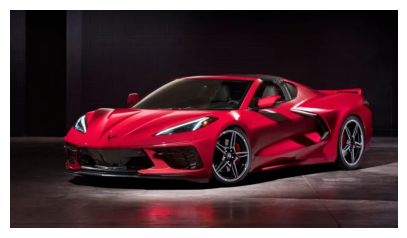

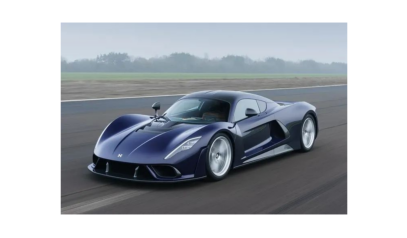

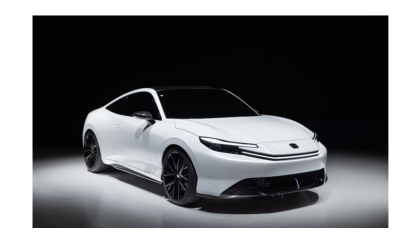

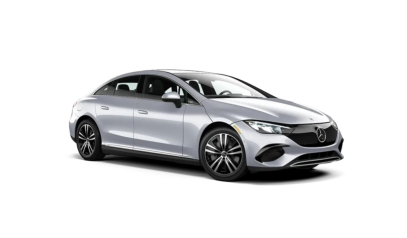

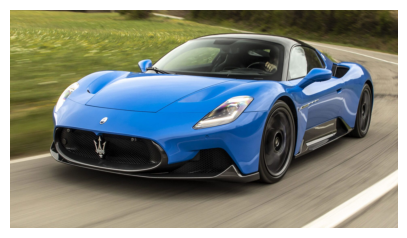

...

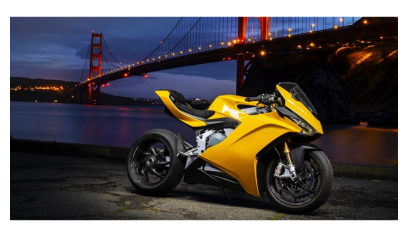

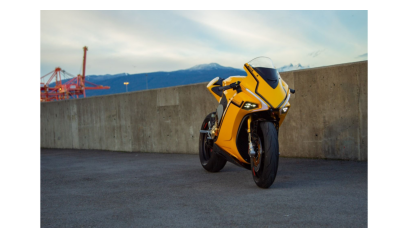

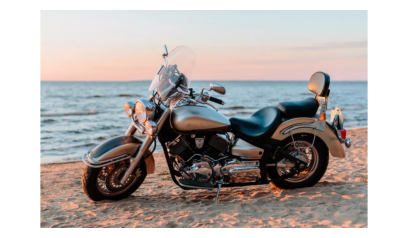

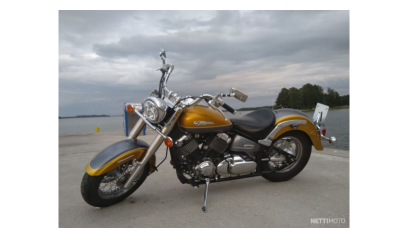

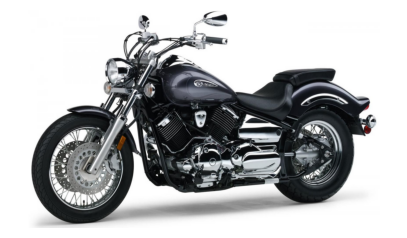

In [ ]:
images = [] #Initialize an empty list to store processed images.

for image in get_slides(url): #Loop through each image obtained from the Google Slides PDF.

    plot(image) #Plot each image using the defined plot function.

    images.append(load(image))  #Apply transformations to each image and append to the list.

images = torch.vstack(images) #Stack all processed images into a single tensor.

In [ ]:
images.shape  #Retrieve and display the shape of the stacked image tensor.

torch.Size([50, 3, 224, 224])

In [ ]:
model(images)  #Pass the stacked image tensor through the model to obtain the output predictions.

tensor([[-4.0364, -1.5113, -2.2490,  ..., -5.4116, -2.2073,  2.7868],
        [-1.2643, -5.3959, -0.9197,  ..., -6.5779, -2.8994,  0.7817],
        [-8.7005, -6.1810,  2.0345,  ..., -5.6783, -3.3615,  4.4612],
        ...,
        [-1.5238, -5.7920,  1.2794,  ..., -2.5621,  0.6935,  0.0262],
        [-1.7540, -0.8945,  0.2604,  ..., -3.7733,  2.8081,  2.8769],
        [-1.7080, -2.3123, -2.6648,  ..., -6.7228, -0.1111,  3.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images)  #Assign the output predictions from the model to variable y.

In [ ]:
y.shape  #Retrieve and display the shape of the output predictions y.

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy()  #Convert the model predictions to a numpy array of class indices.

In [ ]:
for i in list(guesses):  #Iterate over the list of predicted class indices.
    print(labels[i])  #Print the corresponding class label for each predicted index.

sports car, sport car
sports car, sport car
sports car, sport car
sports car, sport car
sports car, sport car
sports car, sport car
convertible
sports car, sport car
convertible
convertible
grille, radiator grille
sports car, sport car
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
pickup, pickup truck
pickup, pickup truck
sports car, sport car
sports car, sport car
sports car, sport car
sports car, sport car
convertible
sports car, sport car
sports car, sport car
convertible
sports car, sport car
sports car, sport car
disk brake, disc brake
disk brake, disc brake
motor scooter, scooter
motor scooter, scooter
disk brake, disc brake
moped
Model T
motor scooter, scooter
motor scooter, scooter
moped
moped
moped
motor scooter, scooter
moped
moped
moped
moped
crash helmet
disk brake, disc brake
disk brake, disc brake
motor scooter, scooter
forklift
cannon
moped
disk brake, disc brake


In [ ]:
Y = np.zeros(50,)  #Create a numpy array of zeros with length 50.
Y[25:] = 1  #Set the values from index 25 onwards to 1.

In [ ]:
Y  #Display the numpy array Y.

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy()  #Convert the model predictions tensor to a numpy array.

In [ ]:
X.shape  #Retrieve and display the shape of the numpy array X containing model predictions.

(50, 1000)

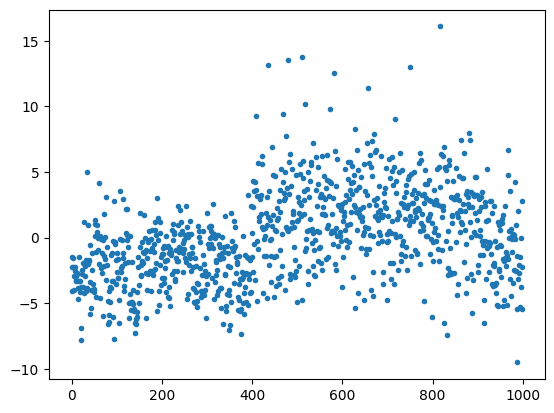

In [ ]:
plt.plot(X[0], '.')  #Plot the first row of the predictions array X as a scatter plot.

In [ ]:
X[0]  #Display the first row of the predictions array X.

array([-4.03638792e+00, -1.51134515e+00, -2.24899125e+00, -2.23888993e+00,
       -1.59063530e+00, -2.90305591e+00, -3.99777269e+00, -2.21178389e+00,
       -2.58114147e+00, -3.26014996e+00, -2.90605211e+00, -3.34069228e+00,
       -2.72650361e+00, -2.77442575e+00, -4.69884825e+00, -3.82524157e+00,
       -1.48580098e+00, -3.30171061e+00, -4.15662479e+00, -3.30106688e+00,
       -3.74395704e+00, -7.80021286e+00, -6.88955164e+00, -2.46233630e+00,
       -2.79542828e+00, -1.96044695e+00, -3.79528999e+00, -4.19668055e+00,
        1.19549704e+00, -2.13184309e+00, -2.90083671e+00, -1.67282927e+00,
       -1.96072793e+00, -4.05400515e+00,  5.04011297e+00, -3.82437634e+00,
        9.71148968e-01, -1.97803569e+00, -1.77591920e+00, -1.70805979e+00,
       -5.70486605e-01, -3.39467096e+00, -5.84200001e+00, -5.33576059e+00,
       -3.98093748e+00, -1.17618215e+00, -2.48272800e+00, -3.97317076e+00,
       -3.53386688e+00, -4.12763166e+00, -3.94996929e+00,  1.06683052e+00,
        1.31574440e+00,  

In [ ]:
np.argmax(X[0])  #Find and display the index of the maximum value in the first row of predictions array X.

817

In [ ]:
labels[948]  #Retrieve and display the label corresponding to index 948 from the labels dictionary.

'Granny Smith'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10]  #Get the indices of the top 10 highest predicted probabilities in descending order.

In [ ]:
for i in top_ten:  #Iterate over the indices of the top 10 highest predicted probabilities.
    print(labels[i])  #Print the corresponding labels for each index.

sports car, sport car
convertible
car wheel
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon
racer, race car, racing car
grille, radiator grille
minivan
crash helmet
go-kart
cab, hack, taxi, taxicab


In [ ]:
labels  #Display the dictionary containing class labels and their corresponding indices.

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([  7.,  83., 226., 295., 228., 116.,  33.,   5.,   5.,   2.]),
 array([-9.51626301, -6.955235  , -4.39420652, -1.8331784 ,  0.72784978,
         3.28887796,  5.84990597,  8.41093445, 10.97196293, 13.53299046,
        16.09401894]),
 <BarContainer object of 10 artists>)

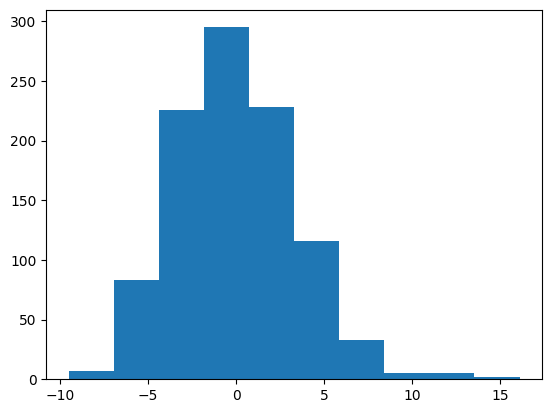

In [ ]:
plt.hist(X[0])  #Plot a histogram of the predicted probabilities for the first image.

In [ ]:
X = GPU_data(X)  #Convert the numpy array X to a GPU tensor without gradients.
Y = GPU_data(Y)  #Convert the numpy array Y to a GPU tensor without gradients.

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x, 1)[0][:, None])  #Compute the exponentials of the input tensor minus its maximum value along axis 1.
    s = s1 / s1.sum(1)[:, None]  #Compute the softmax probabilities by dividing each element by the sum of elements along axis 1.
    return s  #Return the softmax probabilities tensor.

1.Exponential Calculation: The softmax function computes the exponential of each element in the input tensor. However, directly exponentiating large numbers can lead to numerical instability and overflow issues. To mitigate this, we subtract the maximum value from each row of the input tensor before exponentiation. This ensures that the largest value in each row becomes 0 after subtraction, reducing the risk of overflow while preserving the relative relationships between values.

2.Normalization: After exponentiation, we normalize the resulting values to obtain probabilities. This is achieved by dividing each exponentiated value by the sum of all exponentiated values along its respective row. This normalization ensures that the output values lie in the range [0, 1] and sum up to 1, representing probabilities.
     
     Broadcasting: Broadcasting is used to perform element-wise operations between tensors of different shapes. In this case, we reshape tensors using [:, None] to ensure that division and subtraction are performed correctly along the appropriate dimensions.

Overall, the code implements the mathematical concepts of softmax normalization while addressing numerical stability concerns.

In [ ]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()]) / outputs.size()[0]  #Compute the cross-entropy loss between predicted outputs and true labels.

This code computes cross-entropy loss between predicted outputs and labels using softmax and logarithms. It measures the difference between predicted and actual probability distributions. The function assumes raw outputs and ground truth labels.

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2) #Generate uniform random numbers between exp(-2) and 1.
    u2 = torch.rand(size) #Generate uniform random numbers between 0 and 1.
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2) #Compute truncated normal distribution.

    return z #Return the samples from the truncated normal distribution.

This code generates samples from a truncated normal distribution using random number generation and transformation techniques: Random Number Generation: Generates uniformly distributed random numbers 𝑢 1 u 1 ​ and 𝑢 2 u 2 ​ using torch.rand(size). Box-Muller Transform: Transforms 𝑢 1 u 1 ​ and 𝑢 2 u 2 ​ into standard normal random variables 𝑧 z using the Box-Muller transform. Truncation: Sets a lower bound for 𝑢 1 u 1 ​ to ensure stability when computing − 2 ln ⁡ ( 𝑢 1 ) −2ln(u 1 ​ ). These steps efficiently produce truncated normal distribution samples.

In [ ]:
def acc(out, y):
    with torch.no_grad():
        return (torch.sum(torch.max(out, 1)[1] == y).item()) / y.shape[0]  #Compute the accuracy of the model predictions.

The "acc" function calculates the accuracy of a model's predictions using its output "out" and the labels "y". It temporarily disables gradient calculation with "torch.no_grad()", then compares predicted indices to actual labels using "torch.max(out,1)". It counts correct predictions, converts to a scalar with ".item()", and returns accuracy by dividing by the sample count, "y.shape[0]".

In [ ]:
X.shape  #Display the shape of the tensor X.

torch.Size([50, 1000])

In [ ]:
def get_batch(mode):
    b = c.b  #Get the batch size.
    if mode == "train":  #If mode is "train", select random samples from the training data.
        r = np.random.randint(X.shape[0] - b)  #Generate a random index within the range of training data.
        x = X[r:r + b, :]  #Select a batch of input samples.
        y = Y[r:r + b]  #Select corresponding batch of output labels.
    elif mode == "test":  #If mode is "test", select random samples from the testing data.
        r = np.random.randint(X_test.shape[0] - b)  #Generate a random index within the range of testing data.
        x = X_test[r:r + b, :]  #Select a batch of input samples.
        y = Y_test[r:r + b]  #Select corresponding batch of output labels.
    return x, y  #Return the batch of input samples and output labels.


Random Index Generation using "np.random.randint()" to select a starting index "r".
Batch Size ("b") determining the number of samples in each batch.
Slicing of arrays "X", "X_test" for input data ("x"), and arrays "Y", "Y_test" for labels ("y").
Mode Selection ("train" or "test") to extract data from either training or test sets.
It handles extracting batches of input data and labels based on the specified mode, utilizing randomization, slicing, and batching typical in ML and DL.

In [ ]:
def model(x,w):

    return x@w[0] #Compute the model output by performing matrix multiplication of input x with weight w[0].

In [ ]:
def make_plots():

    acc_train = acc(model(x, w), y)  #Compute the training accuracy.

    wb.log({"acc_train": acc_train})  #Log the training accuracy using wandb.

In [ ]:
wb.init(project="Linear_Model_Photo_1")
c = wb.config

c.h = 0.001  #Set the learning rate.
c.b = 4  #Set the batch size.
c.epochs = 100000  #Set the number of epochs.

w = [GPU(Truncated_Normal((1000, 2)))]  #Initialize the weight parameters.

optimizer = torch.optim.Adam(w, lr=c.h)  #Initialize the Adam optimizer with the specified learning rate.

for i in range(c.epochs):

    x, y = get_batch('train')  #Get a batch of training data.

    loss = cross_entropy(softmax(model(x, w)), y)  #Compute the cross-entropy loss.

    optimizer.zero_grad()  #Zero the gradients.
    loss.backward()  #Backpropagate the gradients.
    optimizer.step()  #Update the weights using the optimizer.

    wb.log({"loss": loss})  #Log the loss using wandb.

    make_plots()  #Generate and log plots using the make_plots function.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-36-c3d856de2607>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))


Initialization: "wb.init(project="Linear_Model_Photo_1")": This line initializes a project named "Linear_Model_Photo_1". "c = wb.config": It seems "wb.config" is being assigned to "c", which might be configuration settings. Hyperparameters: "c.h = 0.001": Sets the learning rate to 0.001. "c.b = 4": This seems like a batch size parameter. "c.epochs = 100000": Defines the number of training epochs.

Model Initialization: "w = [GPU(Truncated_Normal((1000,2)))]": Initializes the model parameters "w" with a shape of (1000, 2) using a truncated normal distribution. This initialization seems tailored for a neural network model with 1000 input neurons and 2 output neurons.

Optimizer: "optimizer = torch.optim.Adam(w, lr=c.h)": Initializes the Adam optimizer with parameters "w" (model weights) and a learning rate "c.h".

Training Loop: "for i in range(c.epochs)": Loops over the specified number of epochs. "x,y = get_batch('train')": Retrieves a batch of training data "x" and corresponding labels "y". "loss = cross_entropy(softmax(model(x,w)),y)": Computes the cross-entropy loss between the predicted probabilities (computed using softmax) and the actual labels.

"optimizer.zero_grad()": Clears the gradients of all optimized tensors. "loss.backward()": Backpropagates the loss, computing gradients of the loss with respect to the model parameters. "optimizer.step()": Updates the model parameters based on the computed gradients using the optimizer's update rule (Adam in this case). "wb.log({"loss": loss})": Logs the loss value for visualization or tracking purposes.

"make_plots()": This function seems to generate plots, likely for visualization of the training process.

In summary, the provided code trains a linear model (perhaps a neural network) using the Adam optimizer with cross-entropy loss. The model is trained for a specified number of epochs, with batches of training data being fed through the model in each iteration.

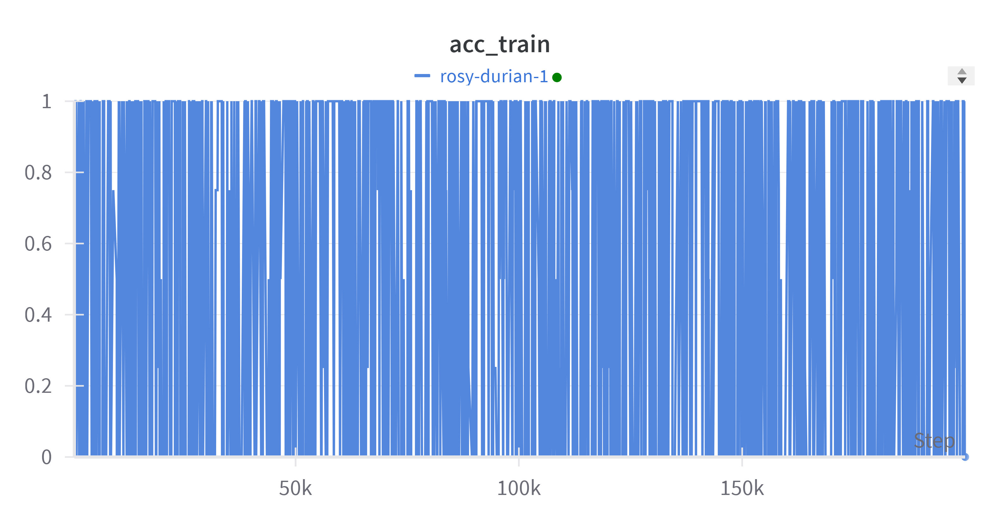

The "acc_train" graph on Weights & Biases visually illustrates how the training accuracy evolves with each epoch during the model's training. This graphical representation serves as a vital tool for tracking enhancements in performance and pinpointing potential problems like overfitting or underfitting. It empowers developers to make well-informed choices regarding modifications to model training techniques or architecture.

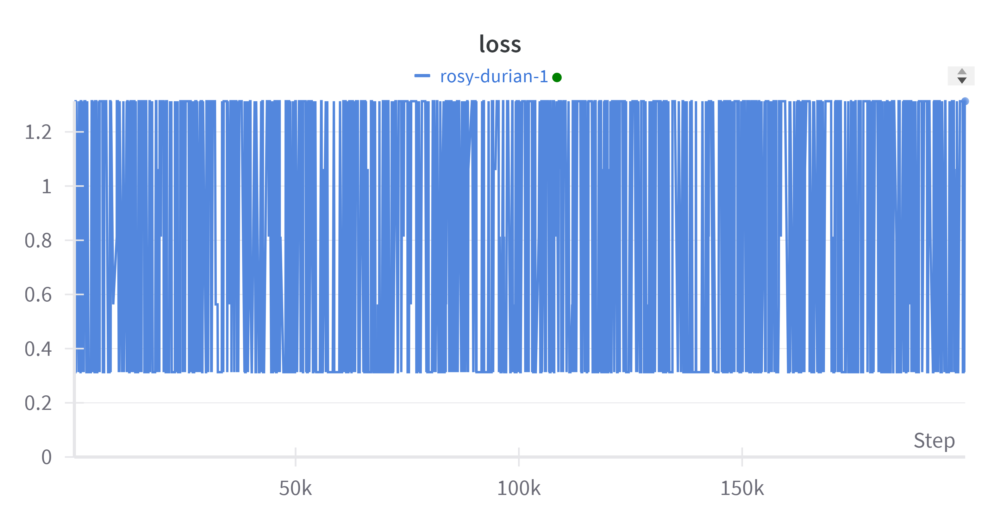

The loss graph provided by Weights & Biases monitors the model's loss metric across each epoch throughout training, illustrating the gradual reduction of the model's error as it assimilates information from the training dataset. This graphical representation serves as a vital tool for assessing the optimization algorithm's efficacy, with a consistently declining loss curve usually indicating successful learning and progression towards a minimum.